In [57]:
import math
import nltk
import spacy
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from transformers import pipeline
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from scipy.stats import pearsonr, spearmanr, f_oneway
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

In [93]:
import warnings
warnings.filterwarnings("ignore")

In [58]:
data = pd.read_csv('Raw_Reviews.csv')

In [59]:
data.head()

,Product_ID,Age,Title,Text_Review,Rating,Type
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,Intimate
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,Bottoms
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,Tops


In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Product_ID   23486 non-null  int64 
 1   Age          23486 non-null  int64 
 2   Title        19676 non-null  object
 3   Text_Review  22641 non-null  object
 4   Rating       23486 non-null  int64 
 5   Type         23472 non-null  object
dtypes: int64(3), object(3)
memory usage: 1.1+ MB


In [61]:
data.describe()

,Product_ID,Age,Rating
count,23486.000000,23486.000000,23486.000000
mean,918.118709,43.198544,4.196032
std,203.298980,12.279544,1.110031
min,0.000000,18.000000,1.000000
25%,861.000000,34.000000,4.000000
50%,936.000000,41.000000,5.000000
75%,1078.000000,52.000000,5.000000
max,1205.000000,99.000000,5.000000


Calling saved data after preprocessing and eda without duplicate values and with age groups

In [137]:
df = pd.read_csv("Reviews_with_age_groups.csv")

In [138]:
df

,Product_ID,Age,Title,Text_Review,Rating,Type,Age_Group
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,Intimate,30-39
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,Dresses,30-39
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,Dresses,60-69
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,Bottoms,50-59
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,Tops,40-49
...,...,...,...,...,...,...,...
22635,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,Dresses,30-39
22636,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,Tops,40-49
22637,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,Dresses,30-39
22638,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,Dresses,20-29


**Sentiment Extraction**

The text reviews were processed to extract the overall sentiment. BERT based model was used to perform sentiment analysis

distilbert - This model is used because it is a faster, smaller version of BERT, retaining 97% of BERT's performance while being more computationally efficient and this is optimized for sentiment analysis with high accuracy on English text.

In [64]:
sentiment_analysis = pipeline("sentiment-analysis", model="distilbert-base-uncased-finetuned-sst-2-english", revision="af0f99b")

In [66]:
# this function defines the process of obtainig the sentiment as per the distilbert model
def sentiment_extractor(text):
    if len(text)>0:        
        result = sentiment_analysis(text)[0]
#         print("Sentiment Analysis:", result['label'])
#         print("Confidence Score:", result['score'])
        return result

In [94]:
df['Sentiment'] = None
df['Confidence Scores'] = None

In [ ]:
for i in tqdm(df.index):
    try:
        if len(df['Text_Review'].loc[i])>0: 
            result = sentiment_extractor(df['Text_Review'].loc[i])
            df['Sentiment'].loc[i] = result['label']
            df['Confidence Scores'].loc[i] = result['score']
    except:
        df['Sentiment'].loc[i] = None
        df['Confidence Scores'].loc[i] = None
#     break

  0%|                                                                                        | 0/23436 [00:00<?, ?it/s]C:\Users\aishw\AppData\Local\Temp\ipykernel_4872\1386884195.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sentiment'].loc[i] = result['label']
C:\Users\aishw\AppData\Local\Temp\ipykernel_4872\1386884195.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Confidence Scores'].loc[i] = result['score']
  0%|▎                                                                            | 92/23436 [00:24<1:43:15,  3.77it/s]C:\Users\aishw\AppData\Local\Temp\ipykernel_4872\1386884195.py:8: SettingW

In [121]:
# the data appended with the sentiment and sentiment scores is saved as another csv
df.to_csv("Reviews_with_Sentiment.csv", index = False)

In [139]:
df = pd.read_csv("Reviews_with_Sentiment.csv")

In [140]:
df

,Product_ID,Age,Title,Text_Review,Rating,Type,Age_Group,Sentiment,Confidence Scores
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,Intimate,30-39,POSITIVE,0.999877
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,Dresses,30-39,POSITIVE,0.998684
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,Dresses,60-69,POSITIVE,0.988560
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,Bottoms,50-59,POSITIVE,0.999888
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,Tops,40-49,POSITIVE,0.999393
...,...,...,...,...,...,...,...,...,...
22635,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,Dresses,30-39,POSITIVE,0.998544
22636,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,Tops,40-49,POSITIVE,0.999400
22637,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,Dresses,30-39,POSITIVE,0.917522
22638,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,Dresses,20-29,NEGATIVE,0.993773


In [141]:
df['Sentiment'].value_counts()

POSITIVE    16675
NEGATIVE     5965
Name: Sentiment, dtype: int64

In [142]:
# analyzing confidence scores of sentiments
ratings = pd.cut(df['Confidence Scores'], bins=[0, 0.4, 1], labels = ['0-0.4', '0.5-1'])
ratings.unique()

['0.5-1']
Categories (2, object): ['0-0.4' < '0.5-1']

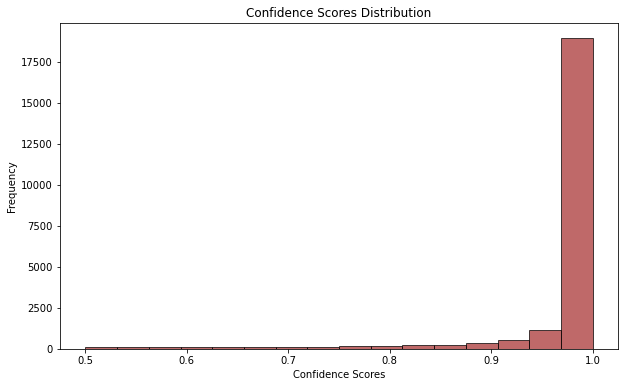

In [143]:
plt.figure(figsize=(10,6))
plt.hist(df['Confidence Scores'], bins=16, edgecolor='black', color='brown', alpha=0.7)
plt.xlabel('Confidence Scores')
plt.ylabel('Frequency')
plt.title('Confidence Scores Distribution')
plt.show()

The distribution of the confidence scores convey that the predicted sentiments are predicted with high confidence.

In [144]:
# the number of positive and negative reviews
positive_reviews = df[df['Sentiment'] == 'POSITIVE'].shape[0]
negative_reviews = df[df['Sentiment'] == 'NEGATIVE'].shape[0]
total_reviews = df.shape[0]

positive_percentage = round(positive_reviews / total_reviews , 2) * 100
negative_percentage = round(negative_reviews / total_reviews, 2) * 100

print(f'Positive Reviews: {positive_percentage}%')
print(f'Negative Reviews: {negative_percentage}%')

Positive Reviews: 74.0%
Negative Reviews: 26.0%


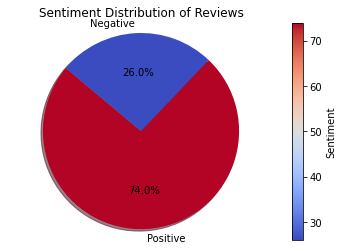

In [145]:
from matplotlib.cm import coolwarm

labels = ['Positive', 'Negative']
sizes = [positive_percentage, negative_percentage]
colormap = coolwarm
norm = plt.Normalize(min(sizes), max(sizes))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', 
        shadow=True, startangle=140, colors=colormap(norm(sizes)))
plt.axis('equal')
plt.title('Sentiment Distribution of Reviews')
plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=colormap), label='Sentiment')
plt.show()

**Analyzing sentiment with respect to each attribute**

In [146]:
# Rating
df.groupby(['Rating','Sentiment']).size().unstack()

Sentiment,NEGATIVE,POSITIVE
Rating,,
1,709,112
2,1242,307
3,1835,988
4,1322,3586
5,857,11682


In [147]:
# talk in terms of percentages - 10% tlalk good but based on the reviews doesnt look good

This is an interesting point to note. The ratings, which are considered as the benchmark of product comparison does not perfectly give a representation of the opinion of the user. This is mainly noted in products with rating of 3 and 4. Ratings of 1 and 2 clearly show negative sentiments dominating and same is the case with the rating of 5 wherein the positive sentiments outweigh the negative ones significantly.

In [148]:
# Age_Group
df.groupby(['Age_Group','Sentiment']).size().unstack()

Sentiment,NEGATIVE,POSITIVE
Age_Group,,
0-19,7,37
20-29,699,2096
30-39,2059,5286
40-49,1595,4308
50-59,960,2874
60-69,533,1723
70-79,95,260
80-100,17,91


In [149]:
# Type
df.groupby(['Type','Sentiment']).size().unstack()

Sentiment,NEGATIVE,POSITIVE
Type,,
Bottoms,946,2715
Dresses,1718,4427
Intimate,387,1266
Jackets,252,750
Tops,2612,7436
Trend,50,68


In [150]:
# Age_Group and Type
d = df.groupby(['Age_Group','Type','Sentiment'])['Rating'].mean().round(2).unstack().reset_index()

In [151]:
d

Sentiment,Age_Group,Type,NEGATIVE,POSITIVE
0,0-19,Bottoms,NaN,4.56
1,0-19,Dresses,NaN,4.38
2,0-19,Intimate,3.20,4.50
3,0-19,Jackets,NaN,5.00
4,0-19,Tops,4.00,4.17
5,20-29,Bottoms,3.12,4.66
6,20-29,Dresses,3.05,4.56
7,20-29,Intimate,2.98,4.63
8,20-29,Jackets,2.68,4.66
9,20-29,Tops,2.94,4.58


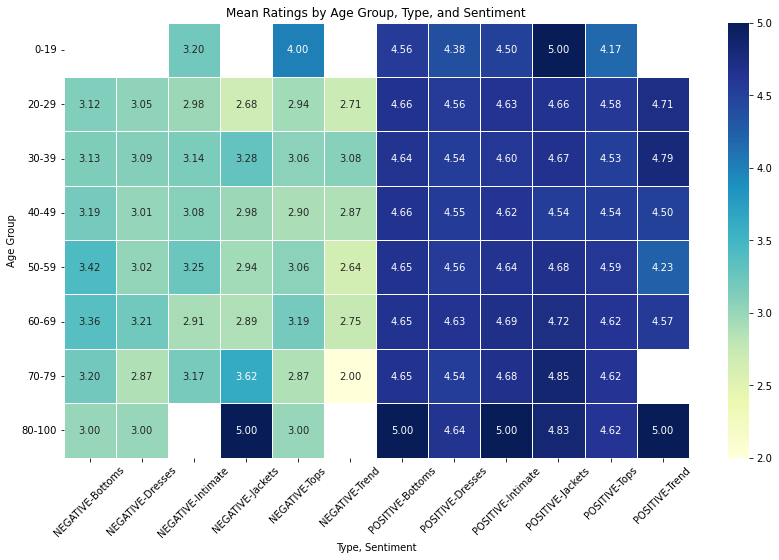

In [152]:
df1 = pd.DataFrame(d)

pivot_df = df1.pivot_table(index='Age_Group', columns=['Type'], values=['NEGATIVE','POSITIVE'])

pivot_df_rounded = pivot_df.round(2)

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_df_rounded, annot=True, cmap='YlGnBu', linewidths=0.5, fmt=".2f")
plt.title('Mean Ratings by Age Group, Type, and Sentiment')
plt.xlabel('Type, Sentiment')
plt.ylabel('Age Group')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**Review Text Analysis**

In [153]:
df.isna().sum()

Product_ID              0
Age                     0
Title                2965
Text_Review             0
Rating                  0
Type                   13
Age_Group               0
Sentiment               0
Confidence Scores       0
dtype: int64

In [154]:
df['Review_Length'] = df['Text_Review'].str.split().apply(len)

In [155]:
df.head()

,Product_ID,Age,Title,Text_Review,Rating,Type,Age_Group,Sentiment,Confidence Scores,Review_Length
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,Intimate,30-39,POSITIVE,0.999877,8
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,Dresses,30-39,POSITIVE,0.998684,62
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,Dresses,60-69,POSITIVE,0.988560,98
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,Bottoms,50-59,POSITIVE,0.999888,22
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,Tops,40-49,POSITIVE,0.999393,36


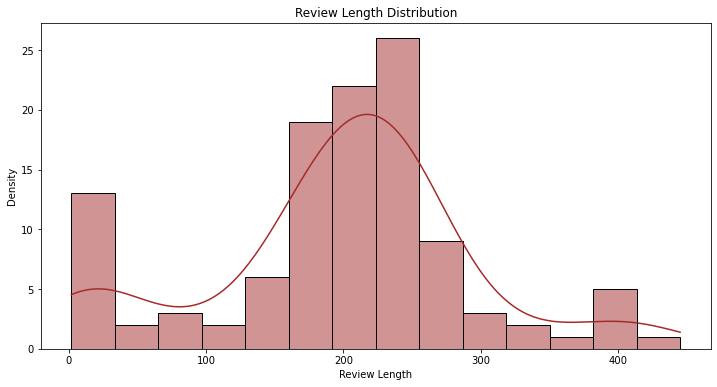

In [156]:
plt.figure(figsize=(12, 6))
sns.histplot(df['Review_Length'].value_counts(), kde=True, color='brown')
plt.title("Review Length Distribution")
plt.ylabel("Density")
plt.xlabel("Review Length")
plt.show()

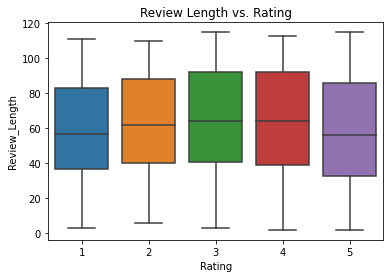

In [157]:
# Visualize Review Length vs. Rating
sns.boxplot(x=df['Rating'], y=df['Review_Length'], data=df)
plt.title('Review Length vs. Rating')
plt.show()

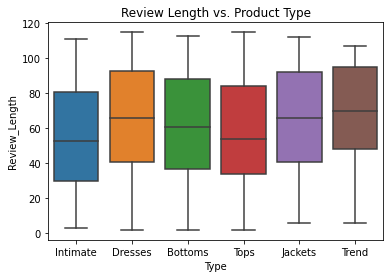

In [158]:
# Visualize Review Length vs. Product Type
sns.boxplot(x=df['Type'], y=df['Review_Length'], data=df)
plt.title('Review Length vs. Product Type')
plt.show()

In [159]:
# Correlation Analysis: Review Length and Rating
pearson_corr, _ = pearsonr(df['Review_Length'], df['Rating'])
spearman_corr, _ = spearmanr(df['Review_Length'], df['Rating'])
print(f"Pearson correlation: {pearson_corr}")
print(f"Spearman correlation: {spearman_corr}")

Pearson correlation: -0.057590025802197305
Spearman correlation: -0.07779786551278067


In [43]:
# ANOVA: Review Length across Product Types
product_type_groups = [group['Review_Length'].values for name, group in df.groupby('Type')]
anova_result = f_oneway(*product_type_groups)
print(f"ANOVA result: F-statistic = {anova_result.statistic}, p-value = {anova_result.pvalue}")

if anova_result.pvalue < 0.05:
    print("\nThere is a significant difference in review lengths across different product types.")
else:
    print("\nThere is no significant difference in review lengths across different product types.")

ANOVA result: F-statistic = 68.28696481235036, p-value = 4.2780126054849655e-71

There is a significant difference in review lengths across different product types.


No significant trends observed between review length vs. ratings

No significant trends observed between review length vs. product type

Pearson correlation indicates a very weak negative linear relationship between review length and rating

Spearman correlation indicates a very weak negative monotonic relationship between review length and rating

Generally, longer reviews might be associated with slightly lower ratings, but the relationship is not strong enough to draw definitive conclusions. While review length can provide some insights into customer feedback, it does not strongly correlate with the ratings given by customers.

**Understanding most common words used in the reviews**

Most common words in the entire set of reviews can be obtained by tokenizing the reviews and counting its occurence within the entire corpus of reviews. This can also be visualized by using WordClouds.

In [16]:
# function defines the process of retrieving the most common words in a set of reviews
def get_most_common_words(reviews):
    tokens = []
    for review in reviews:
        tokens.extend(nltk.word_tokenize(review.lower()))

    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word.isalnum() and word not in stop_words]

    word_freq = Counter(filtered_tokens)

    top_words = word_freq.most_common(10)
    return top_words

In [17]:
# function defines the process of generating a WordCloud for a set of reviews
def gen_word_cloud(reviews):
    all_text = ' '.join([word for word in reviews])
    
    import time
    from wordcloud import WordCloud
    import matplotlib.pyplot as plt

#     wordcloud = WordCloud(width=800, height=400, max_words=50, background_color='white', font_path='arial.ttf').generate(all_text)
    wordcloud = WordCloud(width=800, height=400, background_color='white', font_path='arial.ttf').generate(all_text)

    # Display the word cloud
    plt.figure(figsize=(16, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    
    timestamp = time.strftime("%Y%m%d_%H%M%S")
    filename = f"wordcloud_{timestamp}.png"
    plt.savefig(filename)
#     plt.savefig('wordcloud')
    
    plt.show()
    return

**Most common words within the entire review dataset**

In [18]:
reviews = df[df['Text_Review'].isna()==False]['Text_Review']

In [19]:
pd.DataFrame(get_most_common_words(reviews), columns=['Word', 'Frequency'])

,Word,Frequency
0,dress,10497
1,love,8937
2,size,8699
3,top,7348
4,fit,7274
5,like,7009
6,wear,6422
7,great,6100
8,would,5427
9,5,5007


**Most common words within the entire review dataset as a WordCloud**

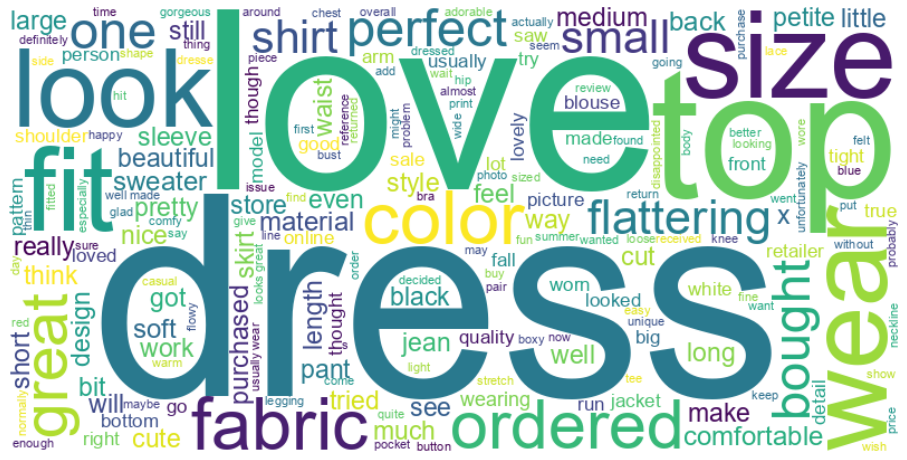

In [93]:
gen_word_cloud(reviews)

**Most common words in the reviews per product type**

In [95]:
inti_df = df[df['Type']=='Intimate']
dress_df = df[df['Type']=='Dresses']
bott_df = df[df['Type']=='Bottoms']
tops_df = df[df['Type']=='Tops']
jack_df = df[df['Type']=='Jackets']
trend_df = df[df['Type']=='Trend']

In [96]:
inti_df_reviews = inti_df[inti_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "intimate" product type review dataset**

In [97]:
print("Intimate")
pd.DataFrame(get_most_common_words(inti_df_reviews), columns=['Word', 'Frequency'])

Intimate


,Word,Frequency
0,love,605
1,size,589
2,like,490
3,wear,487
4,fit,463
5,great,436
6,small,415
7,would,385
8,top,370
9,soft,347


**Most common words within the "intimate" product type review dataset as a WordCloud**

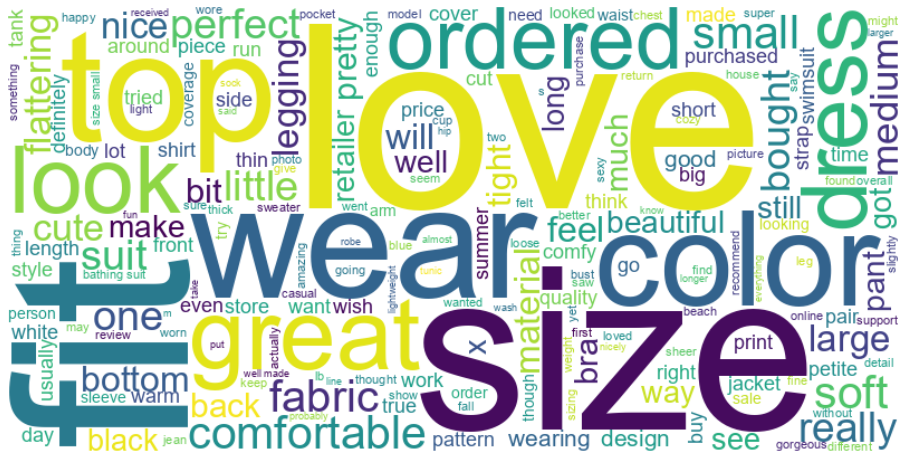

In [97]:
gen_word_cloud(inti_df_reviews)

In [99]:
dress_df_reviews = dress_df[dress_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "dress" product type review dataset**

In [100]:
print("Dress")
pd.DataFrame(get_most_common_words(dress_df_reviews), columns=['Word', 'Frequency'])

Dress


,Word,Frequency
0,dress,9432
1,size,2606
2,love,2312
3,fit,2101
4,like,1890
5,wear,1768
6,5,1754
7,would,1681
8,fabric,1631
9,great,1450


**Most common words within the "dress" product type review dataset as a WordCloud**

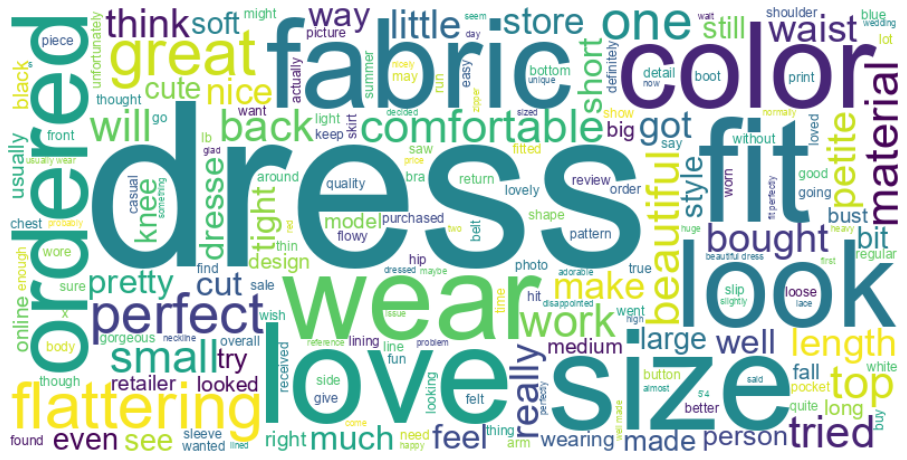

In [101]:
gen_word_cloud(dress_df_reviews)

In [102]:
bott_reviews = bott_df[bott_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "bottom" product type review dataset**

In [103]:
print("Bottom")
pd.DataFrame(get_most_common_words(bott_reviews), columns=['Word', 'Frequency'])

Bottom


,Word,Frequency
0,fit,1793
1,size,1767
2,love,1551
3,skirt,1257
4,pants,1247
5,great,1177
6,like,1149
7,5,1057
8,wear,1056
9,jeans,997


**Most common words within the "bottom" product type review dataset as a WordCloud**

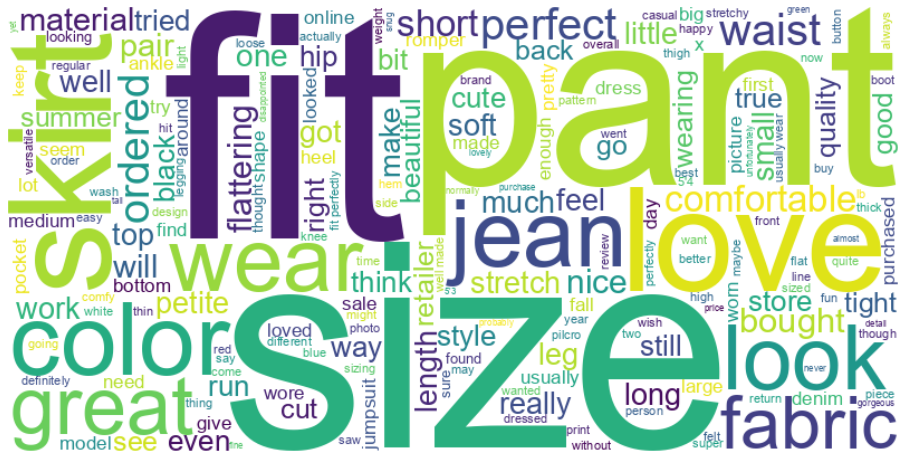

In [112]:
gen_word_cloud(bott_reviews)

In [104]:
tops_df_reviews = tops_df[tops_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "tops" product type review dataset**

In [105]:
print("Top")
pd.DataFrame(get_most_common_words(tops_df_reviews), columns=['Word', 'Frequency'])

Top


,Word,Frequency
0,top,5710
1,love,3976
2,size,3315
3,like,3071
4,wear,2758
5,great,2722
6,fit,2588
7,shirt,2320
8,would,2315
9,color,2250


**Most common words within the "tops" product type review dataset as a WordCloud**

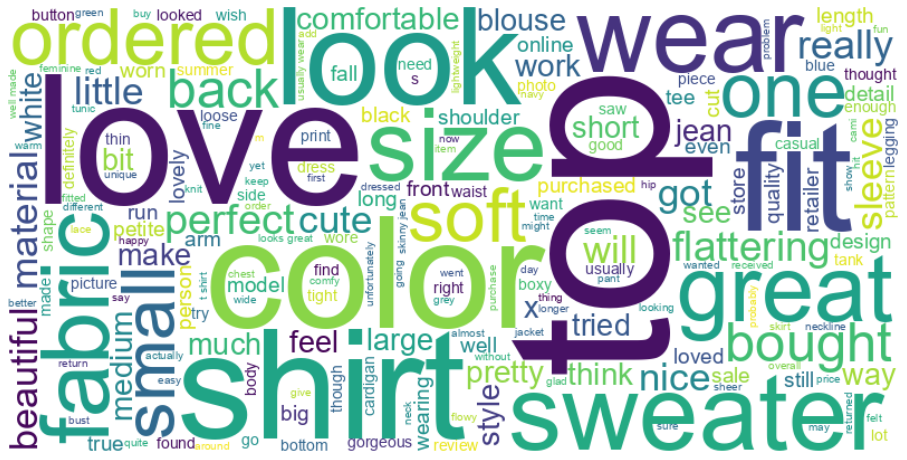

In [106]:
gen_word_cloud(tops_df_reviews)

In [107]:
jack_df_reviews = jack_df[jack_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "jacket" product type review dataset**

In [109]:
print("Jacket")
pd.DataFrame(get_most_common_words(jack_df_reviews), columns=['Word', 'Frequency'])

Jacket


,Word,Frequency
0,jacket,629
1,love,449
2,size,365
3,like,356
4,wear,314
5,coat,298
6,great,286
7,small,285
8,fit,282
9,would,243


**Most common words within the "jacket" product type review dataset as a WordCloud**

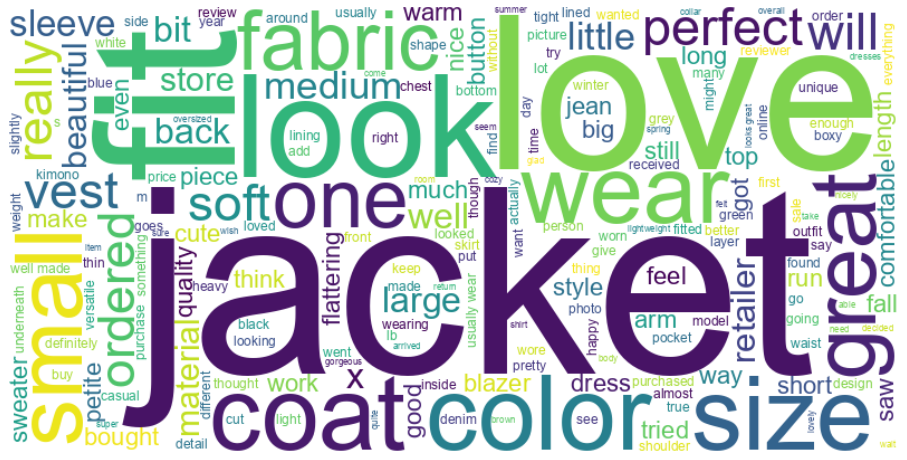

In [110]:
gen_word_cloud(jack_df_reviews)

In [111]:
trend_df_reviews = trend_df[trend_df['Text_Review'].isna()==False]['Text_Review']

**Most common words within the "trend" product type review dataset**

In [112]:
print("Trend")
pd.DataFrame(get_most_common_words(trend_df_reviews), columns=['Word', 'Frequency'])

Trend


,Word,Frequency
0,dress,86
1,size,55
2,like,52
3,fit,44
4,fabric,39
5,love,38
6,would,37
7,look,35
8,wear,33
9,beautiful,32


**Most common words within the "trend" product type review dataset as a WordCloud**

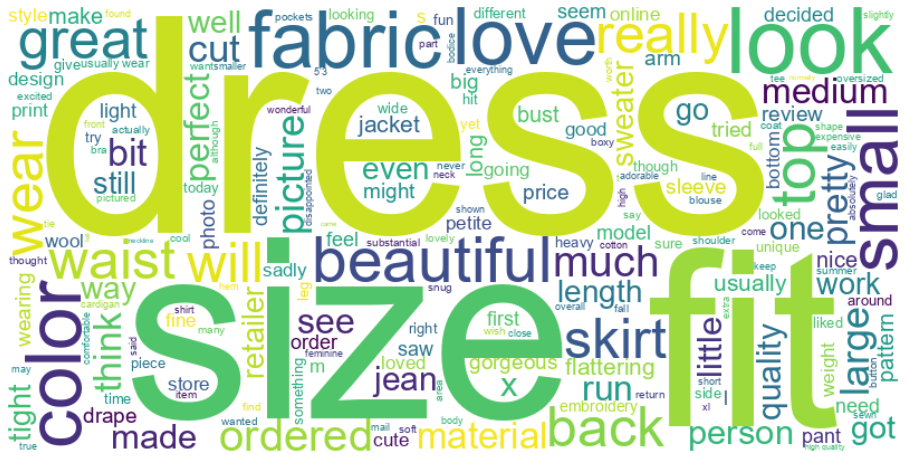

In [125]:
gen_word_cloud(trend_df_reviews)

**Analyzing most used words under different conditions of other attributes**

In [ ]:
# Positive Sentiment Top Words
gen_word_cloud(df[(df['Text_Review'].isna()==False) & (df['Sentiment']=='POSITIVE')]['Text_Review'])

In [ ]:
# Negative Sentiment Top Words
gen_word_cloud(df[(df['Text_Review'].isna()==False) & (df['Sentiment']=='NEGATIVE')]['Text_Review'])

**Age of customer vs keywords in reviews**

In [42]:
reviews019 = df[df['Age_Group']=='0-19']['Text_Review']
print("Age Group : 0-19")
pd.DataFrame(get_most_common_words(reviews019), columns=['Word', 'Frequency'])

Age Group : 0-19


,Word,Frequency
0,dress,29
1,like,20
2,top,17
3,size,16
4,really,15
5,small,15
6,well,13
7,little,13
8,fit,13
9,wear,13


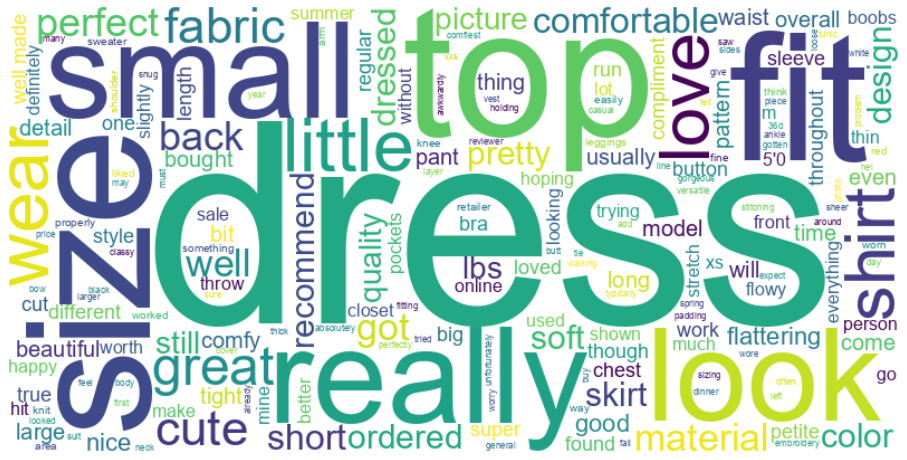

In [33]:
gen_word_cloud(reviews019)

In [43]:
reviews2029 = df[df['Age_Group']=='20-29']['Text_Review']
print("Age Group : 20-29")
pd.DataFrame(get_most_common_words(reviews2029), columns=['Word', 'Frequency'])

Age Group : 20-29


,Word,Frequency
0,dress,1592
1,love,1131
2,size,1016
3,top,943
4,fit,897
5,like,825
6,wear,811
7,would,732
8,great,731
9,5,611


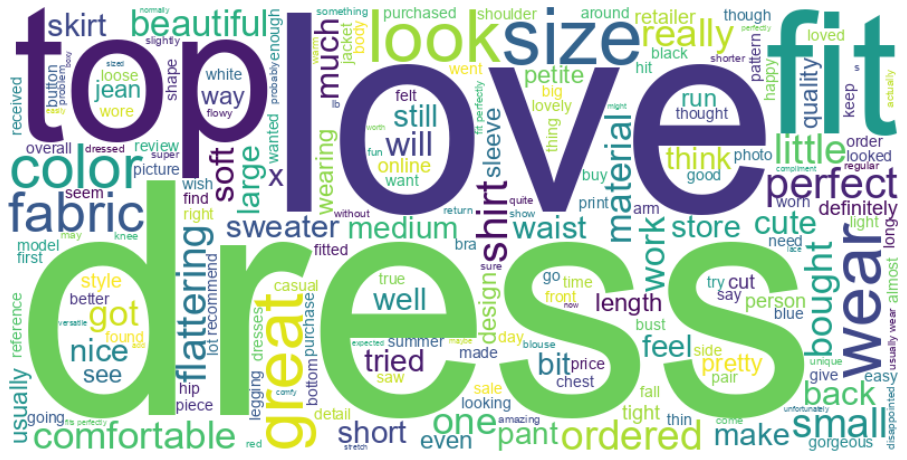

In [34]:
gen_word_cloud(reviews2029)

In [44]:
reviews3039 = df[df['Age_Group']=='30-39']['Text_Review']
print("Age Group : 30-39")
pd.DataFrame(get_most_common_words(reviews3039), columns=['Word', 'Frequency'])

Age Group : 30-39


,Word,Frequency
0,dress,3508
1,love,2873
2,size,2753
3,like,2443
4,fit,2419
5,top,2270
6,great,2036
7,wear,2000
8,would,1877
9,5,1667


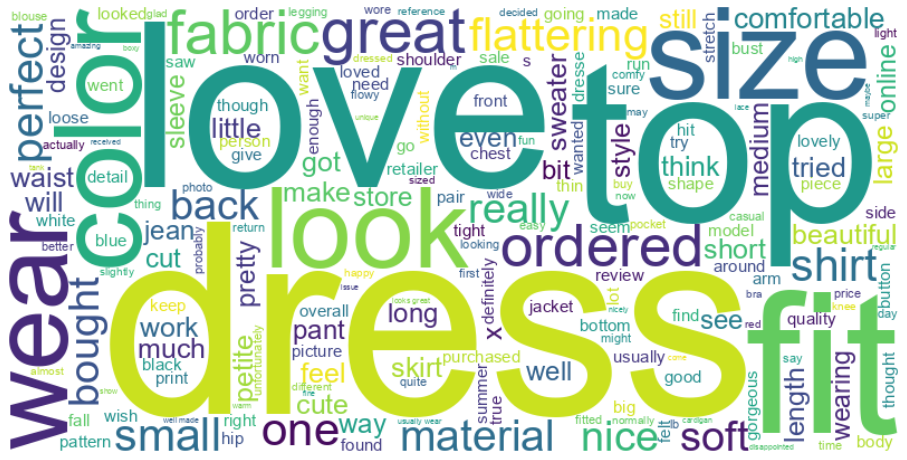

In [35]:
gen_word_cloud(reviews3039)

In [45]:
reviews4049 = df[df['Age_Group']=='40-49']['Text_Review']
print("Age Group : 40-49")
pd.DataFrame(get_most_common_words(reviews4049), columns=['Word', 'Frequency'])

Age Group : 40-49


,Word,Frequency
0,dress,2660
1,love,2345
2,size,2309
3,top,1868
4,fit,1837
5,like,1782
6,wear,1678
7,great,1596
8,would,1348
9,5,1313


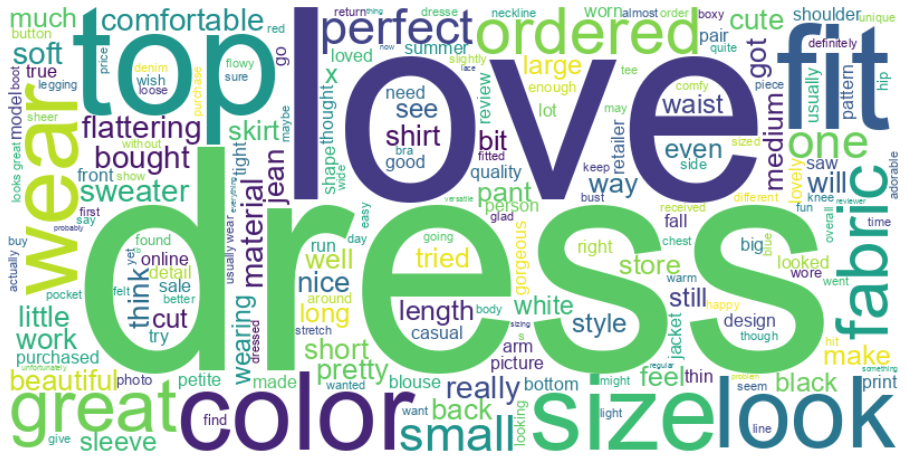

In [36]:
gen_word_cloud(reviews4049)

In [46]:
reviews5059 = df[df['Age_Group']=='50-59']['Text_Review']
print("Age Group : 50-59")
pd.DataFrame(get_most_common_words(reviews5059), columns=['Word', 'Frequency'])

Age Group : 50-59


,Word,Frequency
0,dress,1677
1,size,1495
2,love,1452
3,top,1295
4,fit,1215
5,like,1156
6,wear,1092
7,great,992
8,5,914
9,fabric,877


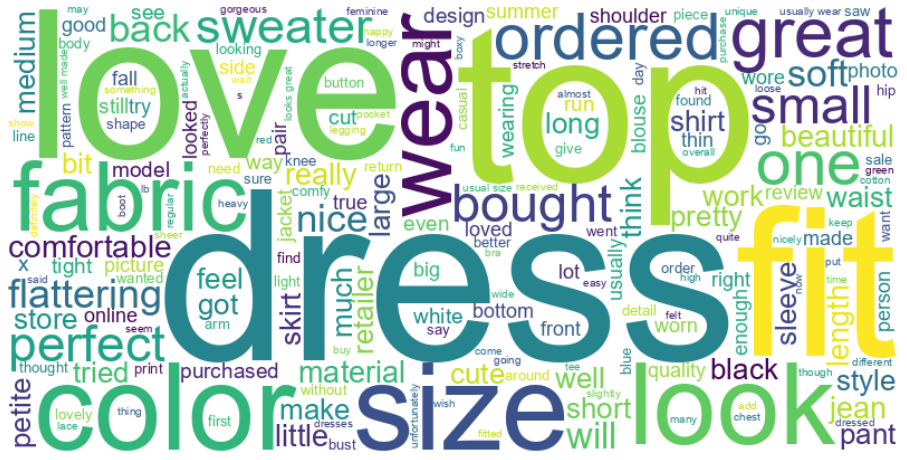

In [37]:
gen_word_cloud(reviews5059)

In [47]:
reviews6069 = df[df['Age_Group']=='60-69']['Text_Review']
print("Age Group : 60-69")
pd.DataFrame(get_most_common_words(reviews6069), columns=['Word', 'Frequency'])

Age Group : 60-69


,Word,Frequency
0,love,922
1,size,902
2,dress,839
3,top,800
4,fit,770
5,wear,686
6,like,667
7,great,618
8,fabric,586
9,color,489


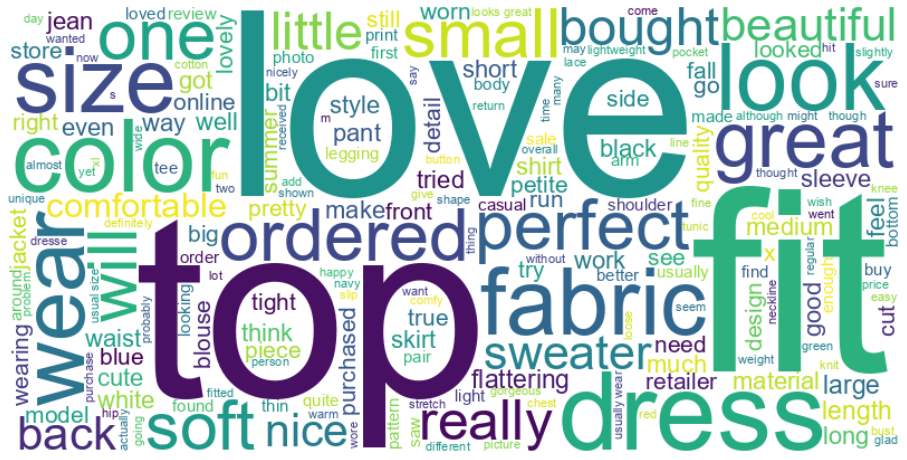

In [38]:
gen_word_cloud(reviews6069)

In [48]:
reviews7079 = df[df['Age_Group']=='70-79']['Text_Review']
print("Age Group : 70-79")
pd.DataFrame(get_most_common_words(reviews7079), columns=['Word', 'Frequency'])

Age Group : 70-79


,Word,Frequency
0,size,143
1,dress,142
2,love,140
3,wear,122
4,top,112
5,fit,95
6,color,94
7,great,94
8,small,86
9,ordered,84


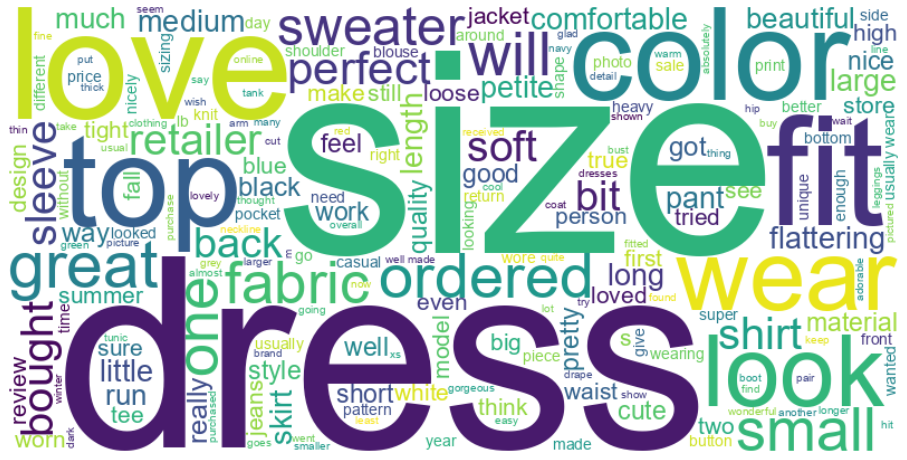

In [39]:
gen_word_cloud(reviews7079)

In [49]:
reviews800 = df[df['Age_Group']=='80-100']['Text_Review']
print("Age Group : 80-100")
pd.DataFrame(get_most_common_words(reviews800), columns=['Word', 'Frequency'])

Age Group : 80-100


,Word,Frequency
0,size,65
1,love,62
2,dress,50
3,ordered,46
4,top,43
5,like,36
6,beautiful,31
7,color,30
8,would,30
9,soft,30


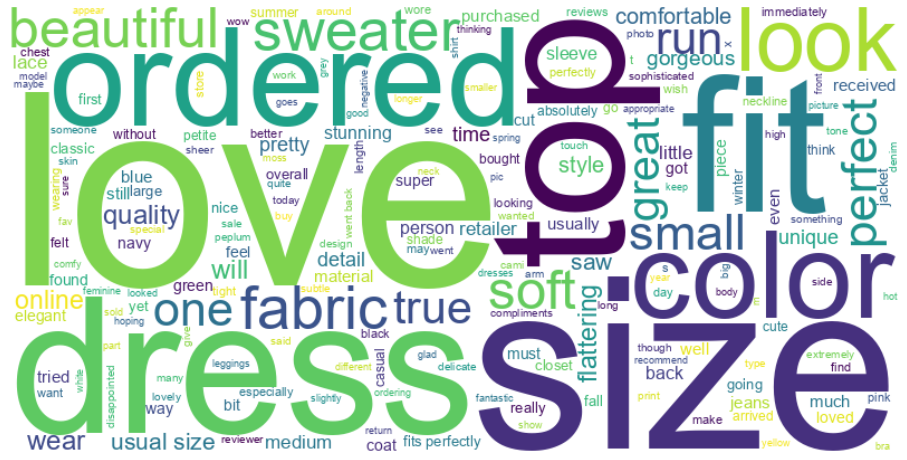

In [41]:
gen_word_cloud(reviews800)

In [51]:
reviews_pos = df[df['Sentiment']=='POSITIVE']['Text_Review']

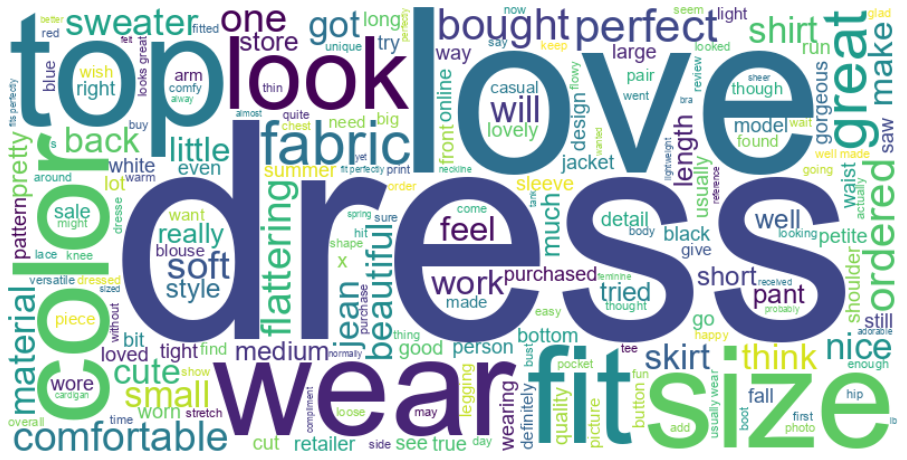

In [52]:
gen_word_cloud(reviews_pos)

In [53]:
pd.DataFrame(get_most_common_words(reviews_pos), columns=['Word', 'Frequency'])

,Word,Frequency
0,love,7591
1,dress,7588
2,size,6309
3,great,5310
4,fit,5276
5,top,5194
6,wear,5065
7,like,4554
8,5,3687
9,color,3488


**NER to identify issues from the negative reviews**

**Topic Modeling using LDA**

In [28]:
# Import necessary libraries
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

# Download NLTK resources
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\aishw\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\aishw\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [30]:
reviews_df = pd.read_csv('Reviews_with_Sentiment.csv')

# Preprocess the text data (cleaning, tokenization, normalization)
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess(text):
    text = re.sub(r'\W', ' ', text)  # Remove special characters
    text = text.lower()  # Convert to lowercase
    tokens = text.split()  # Tokenize
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]  # Lemmatize and remove stopwords
    return ' '.join(tokens)

preprocessed_reviews = [preprocess(review) for review in reviews_df[reviews_df['Sentiment']=='NEGATIVE']['Text_Review']]

In [31]:
# TF-IDF Vectorization for Keyword Extraction
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(preprocessed_reviews)

# LDA Topic Modeling
num_topics = 5  
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_model.fit(tfidf_matrix)

LatentDirichletAllocation(n_components=5, random_state=42)

In [32]:
# Get top keywords for each topic
feature_names = tfidf_vectorizer.get_feature_names_out()
top_keywords_per_topic = []
for topic_idx, topic in enumerate(lda_model.components_):
    top_keywords_idx = topic.argsort()[:-10 - 1:-1]  
    top_keywords = [feature_names[i] for i in top_keywords_idx]
    top_keywords_per_topic.append(top_keywords)

# Print top keywords for each topic
for i, keywords in enumerate(top_keywords_per_topic):
    print(f"Topic {i+1}: {', '.join(keywords)}")

Topic 1: quality, fabric, look, like, design, dress, price, cute, poor, material
Topic 2: size, dress, color, small, fit, like, ordered, look, wear, medium
Topic 3: size, dress, fit, small, like, shirt, wear, look, love, ordered
Topic 4: blocking, boring, disproportionate, paper, harder, robe, frankly, select, chemise, sooooo
Topic 5: dress, look, like, fabric, fit, love, material, color, sweater, really


In [81]:
# a sample set of kewords associated with each negative reviews
from rake_nltk import Rake

r = Rake()
for review_text in reviews_df[reviews_df['Sentiment']=='NEGATIVE']['Text_Review']:
    r.extract_keywords_from_text(review_text)
    extracted_keywords = r.get_ranked_phrases()[:10]
    print(f"Review: {review_text}")
    print(f"Extracted Keywords: {', '.join(extracted_keywords)}")
    print("----")

Review: I love tracy reese dresses, but this one is not for the very petite. i am just under 5 feet tall and usually wear a 0p in this brand. this dress was very pretty out of the package but its a lot of dress. the skirt is long and very full so it overwhelmed my small frame. not a stranger to alterations, shortening and narrowing the skirt would take away from the embellishment of the garment. i love the color and the idea of the style but it just did not work on me. i returned this dress.
Extracted Keywords: skirt would take away, love tracy reese dresses, 5 feet tall, usually wear, small frame, skirt, love, work, style, stranger
----
Review: I aded this in my basket at hte last mintue to see what it would look like in person. (store pick up). i went with teh darkler color only because i am so pale :-) hte color is really gorgeous, and turns out it mathced everythiing i was trying on with it prefectly. it is a little baggy on me and hte xs is hte msallet size (bummer, no petite). i 

Extracted Keywords: could probably even go, 29 fit comfortably, usually wind, usually wear, right fit, please make, pilcro chinos, aptly named, fit, 29
----
Review: I really like these jeans, but order a size down. i'm typically a 14 and these were just too big. they stretch as it is and although they should have a baggier fit, they are just too baggie.
Extracted Keywords: really like, baggier fit, typically, stretch, size, order, jeans, big, baggie, although
----
Review: Here's the thing: this is a sweatercoat. it's not a coat. it's not something i'll be able to wear independently by the end of november, though i'm enjoying doing so now. it's boiled wool, and not lined, and though it's cozy and warm enough for a morning walk to the train in the high 40s, its role is going to end up being a mid layer. i'm also enjoying wearing it over both dresses and pants at work, serving as a kind of cardigan/blazer combination.
i purchased the pink, which i saw online first a
Extracted Keywords: sa

----
Review: Other reviews are correct. but this has potential to look as good as on the model - structure and quality of the cotton are very flattering. makes legs look miles long. however this fits very tight, allows no room for extra tummy, hips, booty, or thighs. i ordered a s (i'm usually a 4) - was able to get it on (step into it from the top), but felt a little self conscious about how tight the fit was. if there was an m, would have definitely sized up, as i really liked the look.
Extracted Keywords: makes legs look miles long, little self conscious, top ),, really liked, extra tummy, definitely sized, look, look, would, usually
----
Review: This is a beautiful dress with unfortunate design flaws at the bodice of the dress. the fit at hips and length is perfect, falling just to my knee (i'm 5'5" 142 lbs.) and grazing my hips. in that regard the fit is spectacular. but the bodice seems cut very oddly, which would require tayloring to correct. the armholes are large and flared at

Review: The chevron pattern on the mint/seaside version needs to be centered in the front to look right. mine was totally off so i returned it and had them overnight me a new one to my vacation address. unfortunately, the 2nd suit i received was also "off center". that one is going back too. would have loved this otherwise! a quality check on this is definitely needed.... beware.
Extracted Keywords: definitely needed .... beware, seaside version needs, vacation address, quality check, look right, going back, chevron pattern, center "., 2nd suit, new one
----
Review: Beautiful dress.  the  printed material under the tulle however hung 3 inches lower than the tulle skirt. i had to take it to the cleaners and have it hemmed to match the length of  tulle skirt because it looked awkward. even after paying full price for the dress i didn't mind spending the extra money to have it hemmed because the dress is that beautiful.
Extracted Keywords: tulle however hung 3 inches lower, paying full pr

Review: I have the long sleeved version of this dress and was super excited to try on the sleeveless version, but it just didn't work nearly as well. the armholes are huge and will definitely show quite a bit of bra. the black pattern was also nothing special. i like the mock turtleneck and the dress has a nice swingy feel - would consider getting it if it went on sale. 

i tried on the small and the extra small - didn't notice a difference between the two. i think i have on the xs in the photo.
Extracted Keywords: would consider getting, nice swingy feel, definitely show quite, also nothing special, long sleeved version, sleeveless version, work nearly, super excited, mock turtleneck, black pattern
----
Review: I bought this online so didn't realize that the fabric at the bottom is very, very stiff. i was expecting something silky, or at least on the softer and more moveable side. the best description i can think of is an overly starched mens dress shirt. that being the case, it kind 

Review: I thought this would be a cute business attire skirt. i hate to say it, but i felt like it flared out as if i were amelia bedelia or some whacky children's book character and not retailer. the fabric made it look bulky. i sadly had to return it.
Extracted Keywords: cute business attire skirt, whacky children, look bulky, felt like, fabric made, book character, amelia bedelia, would, thought, say
----
Review: Picked this up end of season sale, but i go to florida a lot so i will still be able to use it. it runs a bit large. i'm usually between a s and m at retailer and i'm a bit heavy right now but the small fit loose and comfortably. i would recommend sizing down if you are between sizes. not itchy but i would wear a cami underneath because it is white and could start to itch after a while i suppose. it's definitely not a soft flowy t. mix of t-shirt material and linen. the main part of the t is cotto
Extracted Keywords: small fit loose, would recommend sizing, bit heavy right,

----
Review: When you look at the online pictures of the navy colored dress, the stripes are diagonal. however, that is not the case with the dress in person. the stripes are all horizontal and not that flattering. such a bummer because i love maeve dresses and thought this would be a great addition to my summer dress rotation. alas, not very flattering, so back it goes.
Extracted Keywords: love maeve dresses, summer dress rotation, navy colored dress, online pictures, great addition, dress, would, thought, stripes, stripes
----
Review: I ordered a size 4, my usual size in tops is s or xs for looser fitted tops, i prefer a more fitted look. for reference i am 5'4" 120 lbs,, 32d. i ordered in pink and the color matches the online image. the pink is shear and i do have to wear a camisole underneath, which does not bother me at all. the top is adorable with jeans or slacks for work.
Extracted Keywords: 120 lbs ,, 32d, looser fitted tops, fitted look, usual size, online image, color matche

Review: I was disappointed in this shirt. the color was not the pretty blue pictured, but rather a grayish blue which may look good on a brunette, but not on a blonde. the fabric felt like linen and wrinkled easily. normally, the quality of the fabric is one of my main reasons to buy holding horses, but this one felt cheap. the detail and craftsmanship was beautiful, and i wish this shirt would have worked for me. i waited for it to go on sale and was very excited to receive it. holding horses is one of
Extracted Keywords: fabric felt like linen, may look good, pretty blue pictured, one felt cheap, buy holding horses, holding horses, grayish blue, wrinkled easily, main reasons, shirt would
----
Review: White and silver threads made fabric look grey. almost dirty. fit was nice and price is great. villa to pool to restaurant would be great. colored fabric would be better.
Extracted Keywords: silver threads made fabric look grey, colored fabric would, restaurant would, almost dirty, white

Review: I'm 5'7", 135 lbs, slender bone structure. the medium fit well in the front but hung to the back of knees in back...just way too long. it would work best on someone closer to 6' tall.
Extracted Keywords: 7 ", 135 lbs, would work best, slender bone structure, medium fit well, someone closer, back ..., back, way, tall, long
----
Review: Much softer fabric than i expected. wrinkles easily.
Extracted Keywords: much softer fabric, wrinkles easily, expected
----
Review: I didn't realize it had a tie around the waist. it seems too much material hanging in the front to tie at the waist. unfortunately the sash is attached and cannot be removed. it's very cute; just not for me.  i will have to return (but sure i can find something else)!
Extracted Keywords: find something else )!, much material hanging, tie around, tie, waist, waist, unfortunately, sure, seems, sash
----
Review: This is a beautiful blouse but it's gigantic. my bra size is 34d and i was swimming in a 2. the bust measured 

----
Review: I like the look of this sweater and i am keeping it. however, i found the fit under the arms a little uncomfortable. there is a large seem that goes under the armpit and is a little bulky and irritating. also would not recommend if you are busty. because of how the stripes run, it looks stretched out over my chest.
Extracted Keywords: stripes run, looks stretched, little uncomfortable, little bulky, large seem, also would, sweater, recommend, look, like
----
Review: Love this top! bought the navy to be a cool matching momma for my kiddos baseball and loved it! bought the light pink and red too! fun off the shoulder tee... love how long it is in the back... one thing i will say is that one of the colors fits slightly different like the hem isn't symmetrical or something so i find myself readjusting but i'm sure i'm the only one who notices it... and it doesn't keep me from wearing it and loving it!!!
Extracted Keywords: colors fits slightly different like, shoulder tee ... 

Review: This blouse is gorgeous, but as other reviewers have noted it runs small and it's very thin. the back is see-through, not the front, though if you tend to wear things a little large and order up a size, the back is fine. my real issue is that it shrank so much when i washed it (on cold, delicate cycle, hang dry) that it's pretty much unwearable now. sad.
Extracted Keywords: pretty much unwearable, wear things, runs small, real issue, little large, hang dry, delicate cycle, much, washed, though
----
Review: Really great shirt, i made the mistake of ordering normal size (xs) and it was way too small. this is more like ordering in dress shirt size- so think 4, 6, 8, etc, definitely going to have to send back and order up to s or m. will be a keeper once i get the right fit!
Extracted Keywords: really great shirt, dress shirt size, ordering normal size, like ordering, think 4, send back, right fit, definitely going, xs, way
----
Review: I loved this top. loved it. the quality and c

----
Review: This dress is not flattering. the slip is very small and short and the dress is big and billowy. like the other reviewer said, its more like a tablecloth that you stick your head through. it was really hard to figure out how to cinch in the waist but it didn't help regardless. the length is not accurate either. i would say it's a pretty short dress (mid thigh) but that probably depends on the person. it also makes you look very horizontal. i was really excited about this dress but it's getting r
Extracted Keywords: pretty short dress, would say, reviewer said, really hard, really excited, probably depends, mid thigh, help regardless, getting r, also makes
----
Review: What a shame this dress is. i wear xl and am 5'2", but the dress in the store in the size xs(!!!!!) looked just the right size. yup! xs was just the right size. i can't imagine anyone who wears m or s finding this dress fit flattering. it would look like a sack. it is an inch or two too short in the front for

Review: I ordered the xl and the colors are just as pictured. the material is so soft. the problems: too short and too small. i'm a little over 5 ft. 5 inches and this top ran so short on me. i wish there were three more inches of material and then it would have been great. it was cut a little tight along the shoulder line too. i was so disappointed that this couldn't work on me. i like a romantic style, especially for comfortable basics. but, this was a pass for me. i had to return it. the ruffles on t
Extracted Keywords: little tight along, top ran, shoulder line, romantic style, comfortable basics, 5 ft, 5 inches, little, inches, xl
----
Review: I have the pineapple dress from last year. when i saw this top with the lemons, i was in love. i don't usually pay this much for a top, but i had a special event coming up. i searched and searched, but nothing compared to the lemon top, so, with my birthday discount, i bit the bullet and ordered it. my first thought was that it didn't seem v

----
Review: The saundra tank is a very pretty and feminine knitted top. it is soft and comes in a very delicate pink color.
i took this on a recent trip and it paired well with capri tights and wedges. it was very comfortable to wear having a medium weight to it. the only issue that i had was that the cut below your arms is very deep and made it difficult to hide the side of your bra. it is a rather loose fit, so if you prefer something more form fitting, you might opt for a smaller size.
Extracted Keywords: rather loose fit, feminine knitted top, delicate pink color, smaller size, saundra tank, recent trip, prefer something, paired well, might opt, medium weight
----
Review: This is a beautiful dress. however, it looked awful on me. i ordered the medium and it was huge. also, i looked 7 months pregnant. not a good style for the short person.
Extracted Keywords: looked 7 months pregnant, looked awful, short person, good style, beautiful dress, ordered, medium, huge, however, also
----

the dress runs very large. i ordered an xs petite. it was about 2 inches too large (4 inches total) on either side across the
Extracted Keywords: bra area --- even though, either side across, 4 inches total, appropriate bra, 2 inches, xs petite, successfully substitute, seems close, one would, lining except
----
Review: This dress has way too much material. the material is really soft and beautiful but there's too much of it. it feels like you're wearing a big sack. sadly i'll be returning it.
Extracted Keywords: really soft, feels like, big sack, much material, much, material, wearing, way, sadly, returning
----
Review: Unlike the other two reviews , i found this dress horrid. i ordered a xs since i am between that and a s. it was just too much fabric for me. . i have a small frame, so it was just so overwhelming, the armholes were big and i felt like i had a bag on me. colors were nice and fabric was soft and light.. the belt made no sense as others have said. length was good. i trie

Extracted Keywords: nice quality material, extremely awkward fit, fit like, could fit, normal xs, bottom portion, 110 lbs, way, sized, short
----
Review: The material is nice and of good thick, quality. feels a bit stiff due to the lovely embroidery. unfortunately this top runs large and is not fitted at all. as the material is thick and stiff it does not drape well which makes for an unflattering look.
Extracted Keywords: top runs large, bit stiff due, unflattering look, lovely embroidery, drape well, good thick, stiff, thick, unfortunately, quality
----
Review: I just received this and had ordered it in my normal size small and it is way too big! sadly xs is sold out so i will just have to return mine. the style is like a swing coat and zips up the front. the material is thinner but nice and can be worn over sweaters or bulkier items! the color is more beige in real life.
Extracted Keywords: normal size small, swing coat, sadly xs, return mine, real life, bulkier items, zips, worn, w

----
Review: I bought a size 8 a few years back not my regular size but when used it tend to sag. so this time i bought a size 6 my regular size.
Extracted Keywords: years back, size 8, size 6, regular size, regular size, used, time, tend, sag, bought
----
Review: This is definitely my go to top for work, weekends or night out with the husband. i've worn it with skinny jeans, black tights and skirts. it goes with just about anything. easy to accessorize with a simple long chain necklace or a statement piece. i think the gray combo was a bit more flattering than the green combo.
Extracted Keywords: simple long chain necklace, statement piece, skinny jeans, green combo, gray combo, black tights, worn, work, weekends, top
----
Review: Note: if you have a large chest, the seams hit in an unflattering spot. nice shirt, just not great for the price.
Extracted Keywords: unflattering spot, seams hit, nice shirt, large chest, price, note, great
----
Review: The suit is lovely, but it is very lo

Review: I love love love this print and had to have it when retailer had their 25% off sale. i think regular price is way too much for this dress as the dress isn't even silk or a better material. but once i got this i was so disappointed, i ordered my usual size and it was just a balloon/tent on me. i felt like i was wearing a maternity dress. plus the ruffle at the top which i thought was a sweet feature felt really awkward and like it was grazing my neck and chin in an annoying way. i don't even want t
Extracted Keywords: sweet feature felt really awkward, think regular price, love love love, felt like, usual size, even want, even silk, better material, annoying way, maternity dress
----
Review: I thought the dress was ok, but was surprised by the cut away triangles of material right under bra band on the sides of dress. i will send back, also a bit too high waisted for me. other than that, the dress is as it appears.
Extracted Keywords: cut away triangles, send back, material right

Review: Very cute top. does require a strapless bra as the straps are further out than most tops, and they also tend to fall down. also, while the top fit well, the top button gaps are far apart and tended to separate to show my chest. easy fix with a snap sewed in.
Extracted Keywords: top fit well, top button gaps, cute top, strapless bra, snap sewed, far apart, easy fix, also tend, also, tops
----
Review: My size is 4 but because they did not have it i ordered 6. a little big but i can fix it. 
the price was very nice. 
i thought it said gray but what i got is more brown.
Extracted Keywords: said gray, ordered 6, little big, thought, size, price, nice, got, fix, brown
----
Review: Lovely fabric, color and embellishment but this shirt was so long i can't even imagine wearing it over leggings.  i felt like i was wearing a dress.  there are too many cute tops on the market to bother having this one tailored (i don't buy sewing or ironing).  
disappointed.
Extracted Keywords: many cute t

Review: So disappointed in the abundance of polyester fabrics that retailer carries these days. especially at this price point. the pattern and style of this dress is beautiful, but i will never spend two hundred dollars (or even half that) on a poly dress. please add more linen, cotton, and silk!
Extracted Keywords: never spend two hundred dollars, retailer carries, price point, polyester fabrics, please add, even half, poly dress, dress, style, silk
----
Review: The front of these is the leather looking material. the back is just a stretchy material. they are comfortable but they run very small. i consistently wear a 27 in this brand. i purchased that size but could barely get them up. definitely size up. i had to exchange. they are cute but i'm not sure they are worth full price. the quality is mediocre and i think you can buy faux leather pants for less at another store.
Extracted Keywords: buy faux leather pants, worth full price, leather looking material, could barely get, stretc

Extracted Keywords: unnecessary waist tie, mini safety pins, unusual bib design, bib embroidery, zipper back, skin tone, much since, interesting print, heavily padded, creatively knotting
----
Review: I rarely write a really negative review and retailer is my favorite store ever. but this dress is awful. i ordered the black and white. the fabric is very poor quality. the colors are washed out. i almost didn't try it on, but i did and found that, for me, the fit was terrible (though some of the reviewer pictures are cute).
Extracted Keywords: really negative review, favorite store ever, reviewer pictures, rarely write, poor quality, cute )., white, washed, try, though
----
Review: I ordered this to wear for a holiday party hoping to have something unique and dressy. it was too bulky at the shoulders and looked like something a football player would wear. the little ruffled flower pieces were random at the top and stuck out in all the wrong directions. it wasn't as elegant as the model p

**spacy NER**

In [75]:
import spacy
import pandas as pd

nlp = spacy.load("en_core_web_sm")
neg_reviews = reviews_df[reviews_df['Sentiment']=='NEGATIVE']['Text_Review']

# Function to identify reasons using NER
def identify_reason(review):
    doc = nlp(review)
    reasons = []
    for ent in doc.ents:
        if ent.label_ == "DATE" and "late" in review.lower():
            reasons.append("late delivery")
        elif ent.label_ == "QUANTITY" or ent.label_ == "PRODUCT":
            reasons.append("size issues")
        elif ent.label_ == "CARDINAL" and "damaged" in review.lower():
            reasons.append("damaged")
        elif ent.label_ == "COLOR":
            reasons.append("color issues")
        elif ent.label_ == "PRODUCT" and any("quality","poor","bad") in review.lower():
            reasons.append("quality issues")
    return reasons


In [76]:
review_reasons = [identify_reason(review) for review in neg_reviews]

df = pd.DataFrame({"Review": neg_reviews, "Reasons": review_reasons})
print(df)

                                                  Review        Reasons
5      I love tracy reese dresses, but this one is no...  [size issues]
6      I aded this in my basket at hte last mintue to...             []
10     Dress runs small esp where the zipper area run...             []
14     This is a nice choice for holiday gatherings. ...             []
22     First of all, this is not pullover styling. th...             []
...                                                  ...            ...
22616  I purchased this for a very good price and i t...  [size issues]
22618  The pattern of this skirt is adorable and look...             []
22630  Cute dress but not for me.  the waist is too h...             []
22632  I'm so impressed with the beautiful color comb...             []
22638  I bought this dress for a wedding i have this ...             []

[5965 rows x 2 columns]


In [77]:
df['Reasons'].value_counts()

[]                                         5666
[size issues]                               237
[size issues, size issues]                   28
[late delivery]                              17
[late delivery, late delivery]               10
[size issues, size issues, size issues]       3
[late delivery, size issues]                  2
[damaged]                                     1
[damaged, damaged]                            1
Name: Reasons, dtype: int64

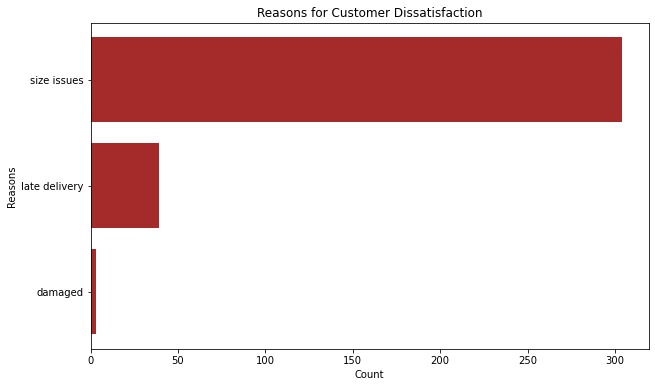

In [78]:
import matplotlib.pyplot as plt
from collections import Counter

reason_counts = Counter(reason for sublist in df['Reasons'] for reason in sublist)
sorted_reason_counts = dict(sorted(reason_counts.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10, 6))
plt.barh(list(sorted_reason_counts.keys()), list(sorted_reason_counts.values()), color='brown')
plt.xlabel('Count')
plt.ylabel('Reasons')
plt.title('Reasons for Customer Dissatisfaction')
plt.gca().invert_yaxis()
plt.show()

**keyword matching**

In [63]:
import pandas as pd
import re

reviews = neg_reviews

# keywords for each possible issue
keywords = {
    "late delivery": ["late", "delay", "delayed", "delivery"],
    "damaged": ["damaged", "torn", "ruined", "delivery", "stitching", "stitches", "holes"],
    "size issues": ["size", "fit", "fitting", "small", "large", "tight", "loose"],
    "color issues": ["color", "colour", "hue", "shade"],
    "quality issues": ["quality", "poor", "bad"],
    "size inclusivity issues": ["inclusive", "options", "sizes"]
}

# Function to identify reasons for bad reviews
def identify_reason(review):
    reasons = []
    for issue, words in keywords.items():
        for word in words:
            if re.search(r'\b{}\b'.format(word), review, flags=re.IGNORECASE):
                reasons.append(issue)
                break
    return reasons

review_reasons = [identify_reason(review) for review in reviews]

df_km = pd.DataFrame({"Review": reviews, "Reasons": review_reasons})
print(df)


                                                  Review  \
5      I love tracy reese dresses, but this one is no...   
6      I aded this in my basket at hte last mintue to...   
10     Dress runs small esp where the zipper area run...   
14     This is a nice choice for holiday gatherings. ...   
22     First of all, this is not pullover styling. th...   
...                                                  ...   
22616  I purchased this for a very good price and i t...   
22618  The pattern of this skirt is adorable and look...   
22630  Cute dress but not for me.  the waist is too h...   
22632  I'm so impressed with the beautiful color comb...   
22638  I bought this dress for a wedding i have this ...   

                             Reasons  
5        [size issues, color issues]  
6        [size issues, color issues]  
10                     [size issues]  
14     [size issues, quality issues]  
22                     [size issues]  
...                              ...  
22616 

In [64]:
df_km['Reasons'].value_counts()

[size issues]                                                            2403
[]                                                                       1546
[size issues, color issues]                                               454
[size issues, quality issues]                                             342
[color issues]                                                            295
[quality issues]                                                          276
[size issues, size inclusivity issues]                                    152
[damaged, size issues]                                                    104
[size issues, color issues, quality issues]                                75
[damaged]                                                                  65
[color issues, quality issues]                                             55
[size inclusivity issues]                                                  33
[size issues, color issues, size inclusivity issues]            

In [60]:
reviews.shape

(5965,)

In [66]:
df_km['Reasons'].value_counts().sum()

5965

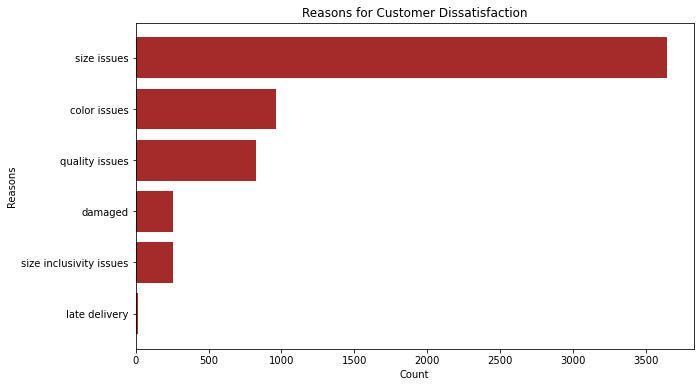

In [72]:
import matplotlib.pyplot as plt
from collections import Counter

reason_counts = Counter(reason for sublist in df_km['Reasons'] for reason in sublist)
sorted_reason_counts = dict(sorted(reason_counts.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10, 6))
plt.barh(list(sorted_reason_counts.keys()), list(sorted_reason_counts.values()), color='brown')
plt.xlabel('Count')
plt.ylabel('Reasons')
plt.title('Reasons for Customer Dissatisfaction')
plt.gca().invert_yaxis()
plt.show()
